<a href="https://colab.research.google.com/github/Ari-03/DSC_210_Project/blob/main/210Project_image_compression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DSC 210 Project: Linear Algebra in Image Compression

## Evaluation metric
- PSNR
- MS-SSIM
- Bit Rate

In [ ]:
def compute_psnr(a, b):
    mse = torch.mean((a - b)**2).item()
    return -10 * math.log10(mse)

def compute_msssim(a, b):
    return ms_ssim(a, b, data_range=1.).item()

def compute_bpp(out_net):
    size = out_net['x_hat'].size()
    num_pixels = size[0] * size[2] * size[3]
    return sum(torch.log(likelihoods).sum() / (-math.log(2) * num_pixels)
              for likelihoods in out_net['likelihoods'].values()).item()

Dataset

- [Kodak](https://www.kaggle.com/datasets/sherylmehta/kodak-dataset)

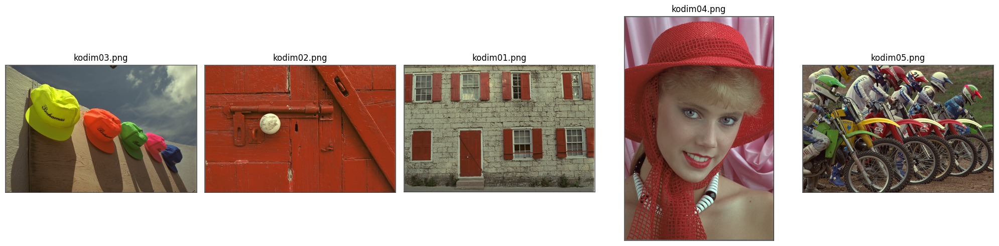

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def show_images(image_folder, num_images=5):
  # Get a list of image files in the directory
  image_files = [f for f in os.listdir(image_folder)]
  selected_images = image_files[:num_images]

  # Set up the matplotlib figure and subplots
  fig, axes = plt.subplots(1, num_images, figsize=(20, 5))

  # Loop through the selected images and display them
  for ax, image_file in zip(axes, selected_images):
      # Open and load the image
      img_path = os.path.join(image_folder, image_file)
      img = Image.open(img_path)

      # Display the image
      ax.imshow(img)
      ax.axis('off')  # Hide the axes

      # Set the title as the image file name
      ax.set_title(image_file)

  # Adjust layout
  plt.tight_layout()
  plt.show()

# Specify the directory containing the images
image_folder_kodak = '/content/drive/MyDrive/Kodak'
show_images(image_folder_kodak)

[Tecnick](https://sourceforge.net/projects/testimages/files/OLD/OLD_SAMPLING/testimages.zip)

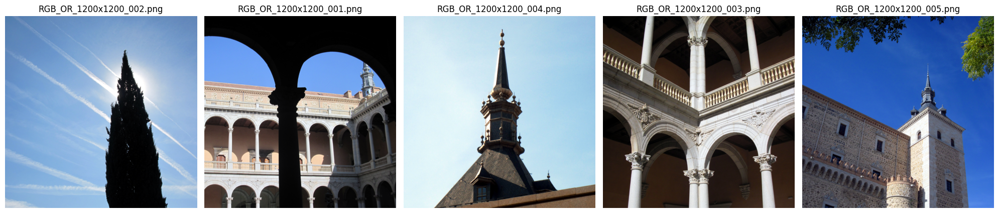

In [ ]:
# Specify the directory containing the images
image_folder_tecnick = '/content/drive/MyDrive/Tecnick'
show_images(image_folder_tecnick)

## Part3 State-of Art Algorithms

### 3.1 Algorithm 1
Based on the article [Joint Autoregressive and Hierarchical Priors for Learned Image Compression](https://arxiv.org/abs/1809.02736).

**Install TensorFlow and CompressAI.**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install compressai

  Using cached compressai-1.2.6.tar.gz (163 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for compressai: filename=compressai-1.2.6-cp310-cp310-linux_x86_64.whl size=405684 sha256=25fa5a81326da46e4044fded916aa515fa4d69f194c60c0e99a41fd501599a92
  Stored in directory: /root/.cache/pip/wheels/b3/e1/85/87edc5d40a531877f35ba1cfc8f66e2e76d49d4845f57c0f46
Successfully built compressai


**Import libraries:**

In [ ]:
import torch
from torchvision import transforms
from compressai.models import JointAutoregressiveHierarchicalPriors
from compressai.zoo import bmshj2018_hyperprior
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt


**Load Model**:

In [ ]:
# Load a pre-trained model (trained with MSE loss)
model = bmshj2018_hyperprior(quality=5, metric="mse", pretrained=True)
model.eval()


**Preprocess Image**:

In [ ]:
from google.colab import files
import os
import cv2

# uploaded = files.upload()
# img_path = list(uploaded.keys())[0]
img_path = "/content/kodim01.png"
img = Image.open(img_path).convert("RGB")

img_np = np.array(img).astype(np.float32) / 255.0
img_tensor = torch.tensor(img_np).permute(2, 0, 1).unsqueeze(0)


NameError: name 'Image' is not defined

**Compress and Reconstruct the Image**:

In [ ]:
with torch.no_grad():
  compressed_output = model.compress(img_tensor)
print("Compression successful.")

compressed_bits = compressed_output["strings"]
compressed_shape = compressed_output["shape"]



# Calculate compressed size
aftercompressed_bits = sum(len(s) * 8 for s in compressed_bits[0])  # Bits
original_size_bits = os.path.getsize(img_path) * 8  # Bits (original file size)

compression_ratio = original_size_bits / aftercompressed_bits

with torch.no_grad():
  decompressed_output = model.decompress(compressed_bits, compressed_shape)
  reconstructed_img = decompressed_output["x_hat"].squeeze(0).permute(1, 2, 0).numpy()

reconstructed_img = (reconstructed_img * 255).clip(0, 255).astype(np.uint8)

psnr = cv2.PSNR((img_np * 255).clip(0, 255).astype(np.uint8), reconstructed_img)
# ssim = cv2.compareSSIM(img_np, reconstructed_img, multichannel=True)

print(f"Original Size: {original_size_bits / 1024:.2f} KB")
print(f"Compressed Size: {aftercompressed_bits / 1024:.2f} KB")
print(f"Compression Ratio: {compression_ratio:.2f}")
print(f"PSNR: {psnr:.2f} dB")
# print(f"SSIM: {ssim:.4f}")


Compression successful.
Original Size: 5753.91 KB
Compressed Size: 415.91 KB
Compression Ratio: 13.83
PSNR: 32.67 dB


**Visualize Results**

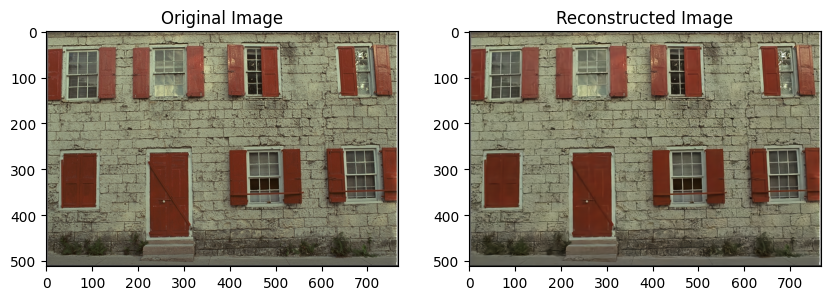

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(img)
axs[0].set_title("Original Image")
axs[1].imshow(reconstructed_img)
axs[1].set_title("Reconstructed Image")
plt.show()


In [ ]:
k = 50 # number of singular value to keep
U, S, Vt = np.linalg.svd(img_np)

reconstructed_matrix = U[:, :k] @ np.diag(S[:k]) @ Vt[:k, :]

reconstructed_img = Image.fromarray(reconstructed_matrix.astype(np.unit8))

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_img)
plt.title("Reconstructed Image SVD (k=50)")

plt.show()

NameError: name 'img_np' is not defined

### 3.2 Algorithm 2
Based on the article [Variational Image Compression with a Scale Hyperprior](https://arxiv.org/abs/1802.01436).

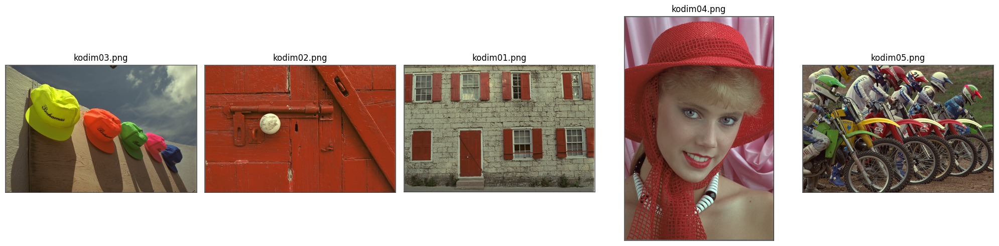

In [ ]:
import torch
from pytorch_msssim import ms_ssim
from torchvision import transforms
import numpy as np
import math
import os
from PIL import Image
import matplotlib.pyplot as plt
from compressai.zoo import bmshj2018_factorized

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = bmshj2018_factorized(quality=1, metric='mse', pretrained=True, progress=True)

Downloading: "https://compressai.s3.amazonaws.com/models/v1/bmshj2018-factorized-prior-1-446d5c7f.pth.tar" to /root/.cache/torch/hub/checkpoints/bmshj2018-factorized-prior-1-446d5c7f.pth.tar
100%|██████████| 11.5M/11.5M [00:00<00:00, 17.1MB/s]


In [ ]:
# Specify the directory containing the images
image_folder_kodak = '/content/drive/MyDrive/Kodak'
# Get a list of image files in the directory
image_files_kodak = [f for f in os.listdir(image_folder_kodak)]

x_hat_list_kodak = []
rec_img_list_kodak = []
diff_list_kodak = []

psnr_list_kodak = []
ssim_list_kodak = []
bpp_list_kodak = []

for img in image_files_kodak:
    img_path = os.path.join(image_folder_kodak, img)
    img = Image.open(img_path).convert("RGB")
    # calculate recustructed x
    x = transforms.ToTensor()(img).unsqueeze(0).to(device)
    with torch.no_grad():
        out_net = model.forward(x)
    out_net['x_hat'].clamp_(0, 1)
    x_hat_list_kodak.append(out_net['x_hat'])
    # calculate metrics
    psnr_list_kodak.append(compute_psnr(x, out_net['x_hat']))
    ssim_list_kodak.append(compute_msssim(x, out_net['x_hat']))
    bpp_list_kodak.append(compute_bpp(out_net))
    # convert x into image
    rec_img = transforms.ToPILImage()(out_net['x_hat'].squeeze().cpu())
    rec_img_list_kodak.append(rec_img)
    # calculate difference
    diff = torch.mean((out_net['x_hat'] - x).abs(), axis=1).squeeze().cpu()
    diff_list_kodak.append(diff)

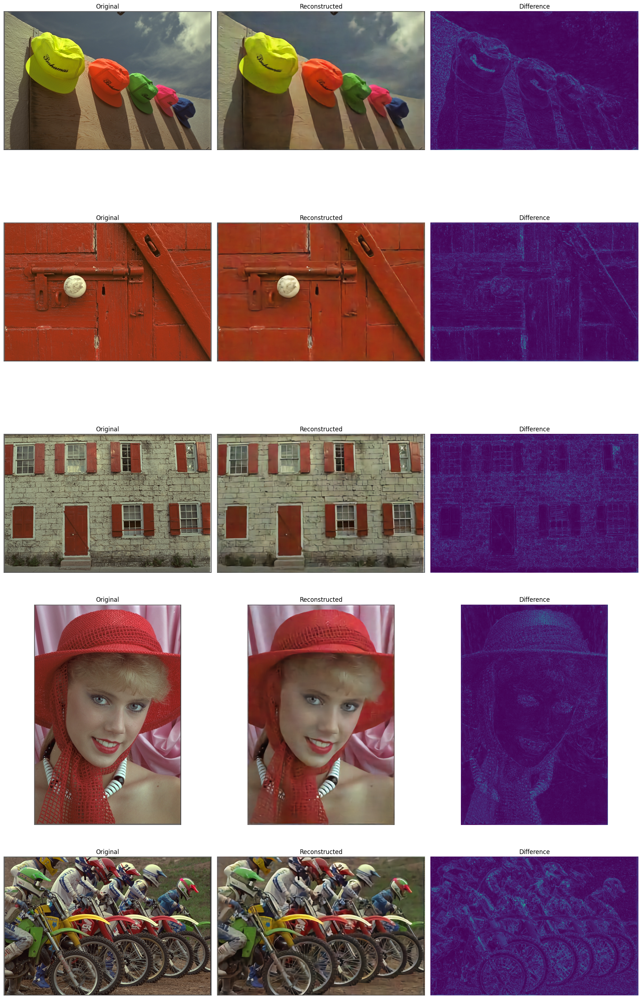

In [ ]:
# Get a list of image files in the directory
image_files = [f for f in os.listdir(image_folder_kodak)]
selected_images_kodak = image_files[:5]
reconstructed_images_kodak = rec_img_list_kodak[:5]
diff_images_kodak = diff_list_kodak[:5]

# Set up the overall figure
fig, axes = plt.subplots(5, 3, figsize=(18, 30))

for i in range(5):
    # Hide axes for all subplots
    for ax in axes[i]:
        ax.axis('off')

    # Original image
    img_path = os.path.join(image_folder_kodak, selected_images_kodak[i])
    img = Image.open(img_path)
    axes[i, 0].imshow(img)
    axes[i, 0].title.set_text('Original')

    # Reconstructed image
    axes[i, 1].imshow(reconstructed_images_kodak[i])
    axes[i, 1].title.set_text('Reconstructed')

    # Difference image
    axes[i, 2].imshow(diff_images_kodak[i], cmap='viridis')
    axes[i, 2].title.set_text('Difference')

# Adjust layout
plt.tight_layout()

In [ ]:
print(f'PSNR: {np.mean(psnr_list_kodak):.4f} dB')
print(f'MS-SSIM: {np.mean(ssim_list_kodak):.4f}')
print(f'Bit-rate: {np.mean(bpp_list_kodak):.4f} bpp')

PSNR: 27.1199 dB
MS-SSIM: 0.9157
Bit-rate: 0.1336 bpp
